In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

# Flow fields

(1024, 1024)


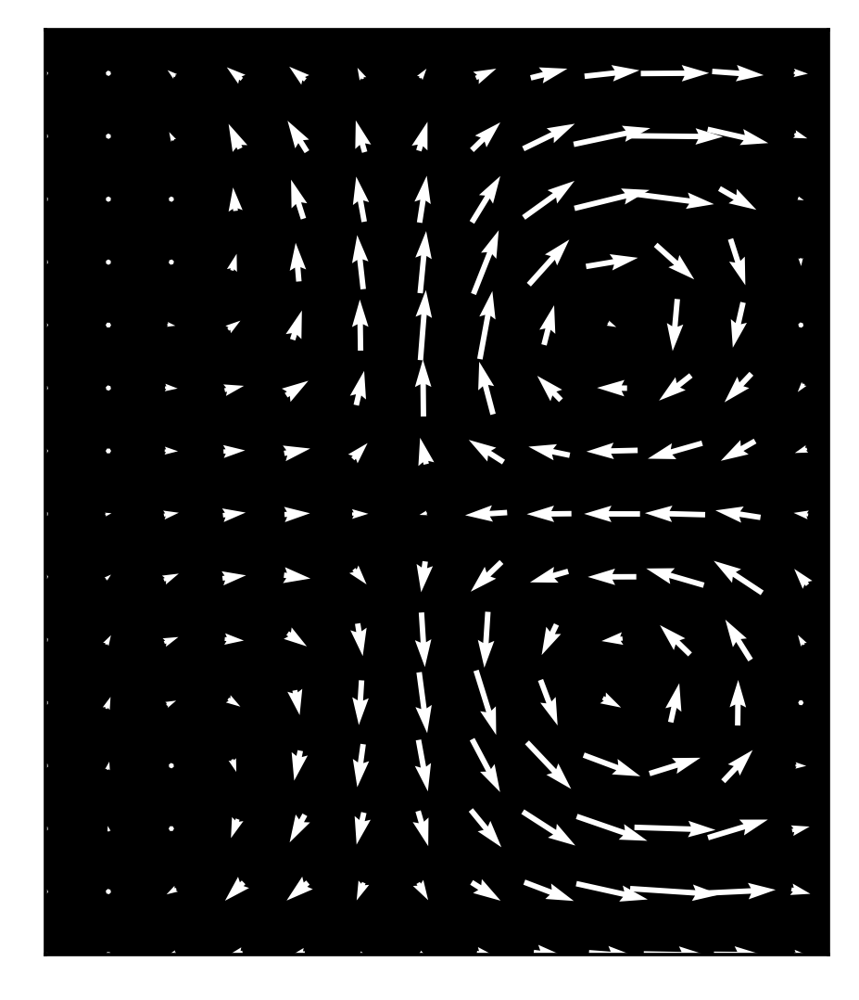

In [14]:
from utils.plot_utils import *

def plot_velocity(ax, f, skip=16):
    ax.clear()
    ax.axis('off')
    X = np.linspace(ap_min, ap_max, f.shape[-1])[::skip]
    Y = np.linspace(dv_min, dv_max, f.shape[-2])[::skip]
    Y, X = np.meshgrid(Y, X, indexing='ij')
    X = X.flatten()
    Y = Y.flatten()
    f0 = f[:, ::skip, ::skip].reshape([2, -1])
    ax.quiver(X, Y, f0[1], f0[0], pivot='middle', color='white', width=0.007)
    ax.set(xticks=[], yticks=[])
    ax.set(xlim=[ap_min, ap_max], ylim=[dv_min, dv_max])
    ax.set_aspect('equal')
    ax.imshow([[0, 0], [0, 0]], extent=[0,696, 0,820], cmap='Greys_r')
    
v = np.load('Public/Halo_Hetero_Twist[ey53]_Hetero/Sqh-GFP/ensemble/velocity2D.npy')

fig, ax = plt.subplots(1, dpi=330)
plot_velocity(ax, v[30])

from PIL import Image
def save_ax(ax, filename='tmp.png', **kwargs):
    ax.axis("off")
    ax.figure.canvas.draw()
    trans = ax.figure.dpi_scale_trans.inverted() 
    bbox = ax.bbox.transformed(trans)
    plt.savefig(filename, dpi="figure", bbox_inches=bbox,  **kwargs)
    ax.axis("on")
    #im = plt.imread(filename)
    im = Image.open(filename).convert('L')
    return im

img = save_ax(ax)
img = img.resize([1024, 1024])
print(img.size)
img.save('Figures/flow_field.png')

# Flow trajectories

In [70]:
from math import floor, ceil
import torchdiffeq
from torch.nn.functional import grid_sample
import torch


def get_velocity(v, tt, grid):
    idxA, idxB = floor(tt), ceil(tt)
    vA, vB = v[None, idxA], v[None, idxB]
    frac = 1 - (tt - idxA)
    vO = grid_sample(frac * vA + (1 - frac) * vB, grid[None], padding_mode='border')
    return vO[0].permute(1, 2, 0)

def rk4DynamicVelocity2D(v, pts, hh, extent):
    #Preprocess
    pts[..., 0] = 2 * ((pts[..., 0] - extent[0]) / (extent[1] - extent[0])) - 1
    pts[..., 1] = 2 * ((pts[..., 1] - extent[2]) / (extent[3] - extent[2])) - 1
    v[:, 0] /= (extent[1] - extent[0]) / 2
    v[:, 1] /= (extent[3] - extent[2]) / 2
    
    tt = torch.arange(0, v.shape[0]-1, hh)
    xyPathsMat = torch.zeros([len(tt), *pts.shape])
    xyPathsMat[0] = pts
    
    for ii in range(len(tt) - 1):
        k1 = get_velocity(v, tt[ii], xyPathsMat[ii])
        k2 = get_velocity(v, tt[ii] + 0.5 * hh, xyPathsMat[ii] + 0.5 * hh * k1)
        k3 = get_velocity(v, tt[ii] + 0.5 * hh, xyPathsMat[ii] + 0.5 * hh * k2)
        k4 = get_velocity(v, tt[ii] + hh, xyPathsMat[ii] + hh * k3)
        
        #Main equation
        xyPathsMat[ii+1] = xyPathsMat[ii] + (k1 + 2 * k2 + 2 * k3 + k4) * hh / 6.
        xyPathsMat[ii+1, xyPathsMat[ii+1] < -1] = -1
        xyPathsMat[ii+1, xyPathsMat[ii+1] > 1] = 1
    
    #Revert to correct units
    xyPathsMat[..., 0] = (xyPathsMat[..., 0] + 1) / 2. * (extent[1] - extent[0]) + extent[0]
    xyPathsMat[..., 1] = (xyPathsMat[..., 1] + 1) / 2. * (extent[3] - extent[2]) + extent[2]
    
    return xyPathsMat.permute(0, 3, 1, 2)

v = np.load('Public/Halo_Hetero_Twist[ey53]_Hetero/Sqh-GFP/ensemble/velocity2D.npy')[:, ::-1]

from skimage.measure import block_reduce
X = torch.linspace(ap_min, ap_max, v.shape[-1] // 4)
Y = torch.linspace(dv_min, dv_max, v.shape[-2] // 4)
XX, YY = torch.meshgrid(X, Y, indexing='xy')
v = torch.from_numpy(block_reduce(v, (1, 1, 4, 4)) / 16).float()
extent = (dv_min, dv_max, ap_min, ap_max)

hh = 0.2
sub = 3
pts = torch.stack([YY[::sub, ::sub], XX[::sub, ::sub]], dim=-1)
xyPaths = rk4DynamicVelocity2D(v[15:30], pts, hh, extent)

(1024, 1024)


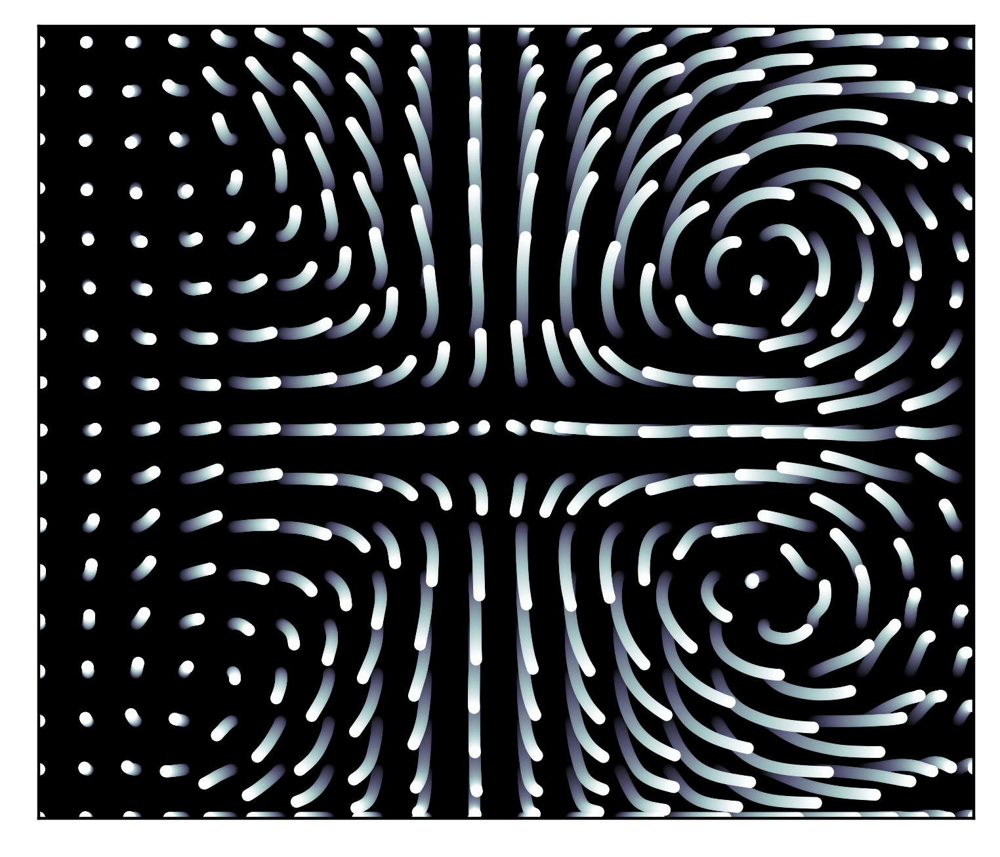

In [73]:
from PIL import Image
def save_ax(ax, filename='tmp.png', **kwargs):
    ax.axis("off")
    ax.figure.canvas.draw()
    trans = ax.figure.dpi_scale_trans.inverted() 
    bbox = ax.bbox.transformed(trans)
    plt.savefig(filename, dpi="figure", bbox_inches=bbox,  **kwargs)
    ax.axis("on")
    im = Image.open(filename).convert('L')
    return im

fig, ax = plt.subplots(1, dpi=400)
ax.imshow([[0, 0], [0, 0]], extent=[dv_min, dv_max, ap_min, ap_max], cmap='Greys_r')
nTps = xyPaths.shape[0]
c = np.ones_like(xyPaths[0, 0])
for tpId in range(nTps):
    ax.scatter(xyPaths[tpId, 0], xyPaths[tpId, 1], s=5, c=c*tpId, cmap='bone', vmin=0, vmax=nTps)
    
ax.set(xlim=[dv_min, dv_max], xticks=[])
ax.set(ylim=[ap_min, ap_max], yticks=[]);

#plt.savefig('flow_trajectories.png', dpi=256)

img = save_ax(ax)
img = img.resize([1024, 1024])
print(img.size)
img.save('Figures/flow_trajectories.png')

# Myosin field

(60, 2050, 1738)
(774, 794, 4)


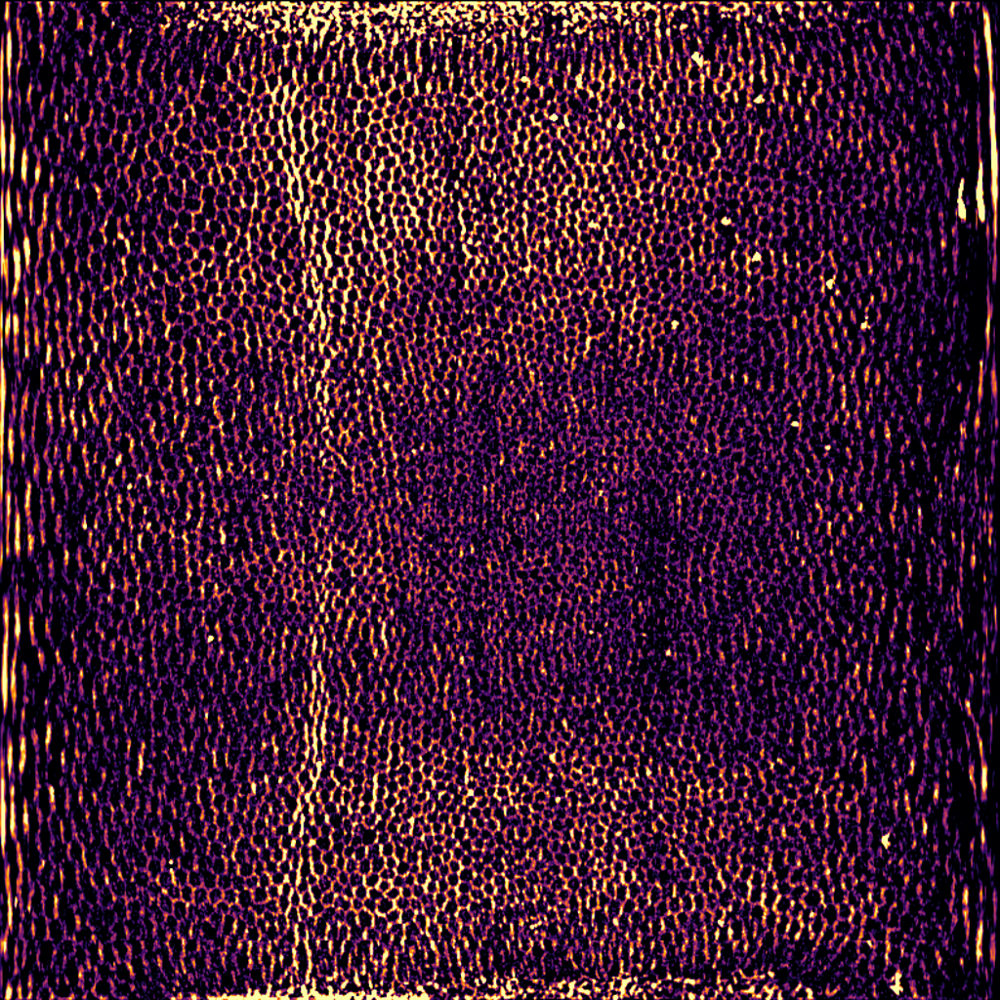

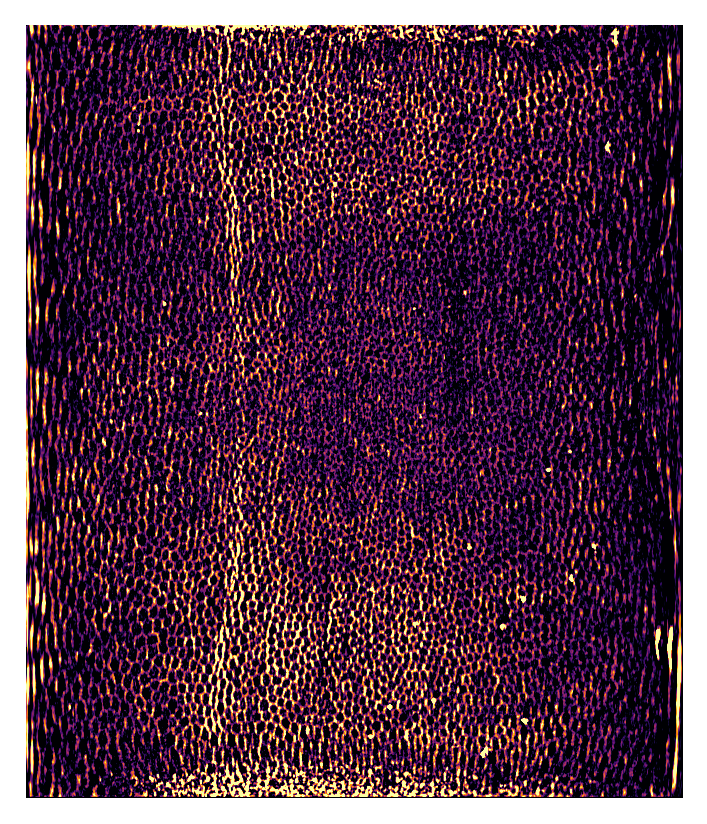

In [18]:
#m = np.load('/project/vitelli/jonathan/fruitfly/MLData/sqh_dataset/sqh-GFP_snailPlus_202101270945_myosin_raw.npy')
m = np.load('/project/vitelli/jonathan/fruitfly/MLData/OLD_datasets/sqh_dataset/sqh-GFP_snailPlus_202101270945_myosin_cytosolic.npy')

print(m.shape)
fig, ax = plt.subplots(1, dpi=256, figsize=(4,4))
ax.axis('off')
tt = 25
tt = 5
#im = ax.imshow(m[tt], cmap='Greys_r', extent=[0,696,0,820], vmax=.15 * np.max(m[tt]), )
#im = ax.imshow(m[tt], cmap='plasma', extent=[0,696,0,820], vmax=.03 * np.max(m[tt]), )
im = ax.imshow(m[tt], cmap='inferno', extent=[0,696,0,820], vmin=.005 * np.max(m[tt]), vmax=.03 * np.max(m[tt]), )


r = plt.gcf().canvas.get_renderer()
im = im.make_image(r)[0]
print(im.shape)
#im[:, im.shape[0]] = 0
from PIL import Image
#img = Image.fromarray(im).convert('L')
img = Image.fromarray(im).convert('RGB')
img = img.resize([1024, 1024])
img.save('myosin_junctional_color.png')
img

# Cadherin field

In [6]:
import windowed_radon as wr
from skimage.morphology import erosion, dilation, disk

size = 21
theta = np.linspace(0, 180, 45, endpoint=False)
radon_matrix = wr.get_radon_tf_matrix(size, theta=theta)

cell_size = 8
structure = disk(cell_size)

def extract_cytosolic_frame(frame):
    background = dilation(erosion(frame, structure), structure)
    normalized = (frame - background) / background
    normalized[background == 0] = 0.
    return normalized

/home/jcolen/fruit_fly/Figures/Fig1FlowTranslation/windowed_radon.py:300: RuntimeWarning: divide by zero encountered in true_divide
  line_weights = 1/(2*np.sqrt(e_len**2-(delta)**2))


(79, 2050, 1738)
(774, 794, 4)


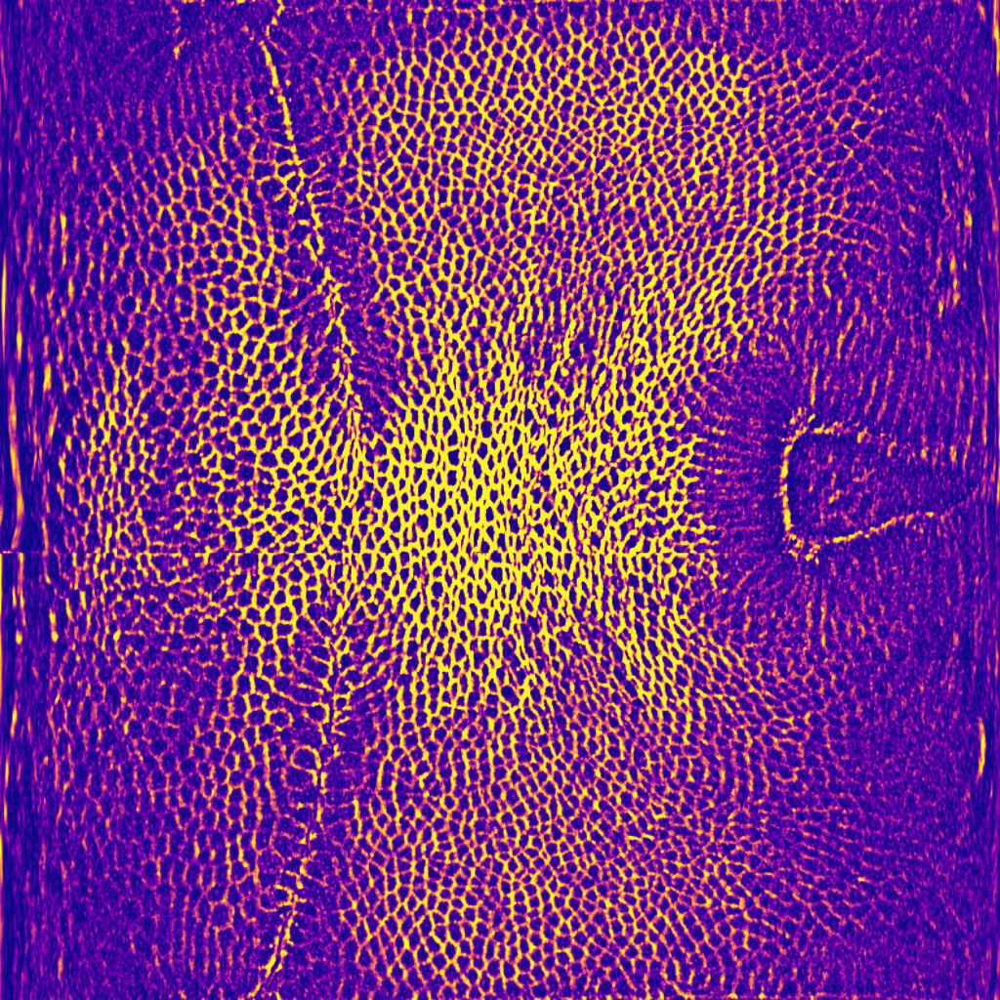

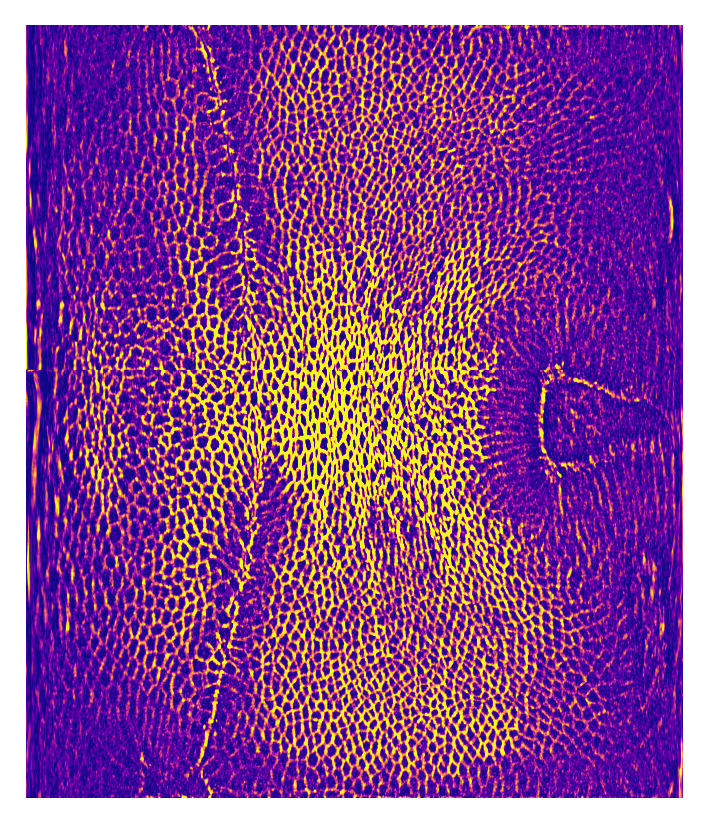

In [20]:
#m = np.load('/project/vitelli/jonathan/fruitfly/MLData/sqh_dataset/sqh-GFP_snailPlus_202101270945_myosin_raw.npy')
from skimage.io import imread
m = imread('/project/vitelli/jonathan/fruitfly/flydrive.synology.me/minimalData/Atlas_Data/WT/ECad-GFP/202001261800/MAX_Cyl1_2_000000_c1_rot_scaled_view1.tif')

print(m.shape)
fig, ax = plt.subplots(1, dpi=256, figsize=(4,4))
ax.axis('off')
tt = 30
m = extract_cytosolic_frame(m[tt])
im = ax.imshow(m, cmap='plasma', extent=[0,696,0,820], vmax=.8 * np.max(m[tt]), )

r = plt.gcf().canvas.get_renderer()
im = im.make_image(r)[0]
print(im.shape)
#im[:, im.shape[0]] = 0
from PIL import Image
#img = Image.fromarray(im).convert('L')
img = Image.fromarray(im).convert('RGB')
img = img.resize([1024, 1024])
img.save('cadherin_junctional_color.png')
img

# Histones

(100, 2050, 1738)
(774, 794, 4)


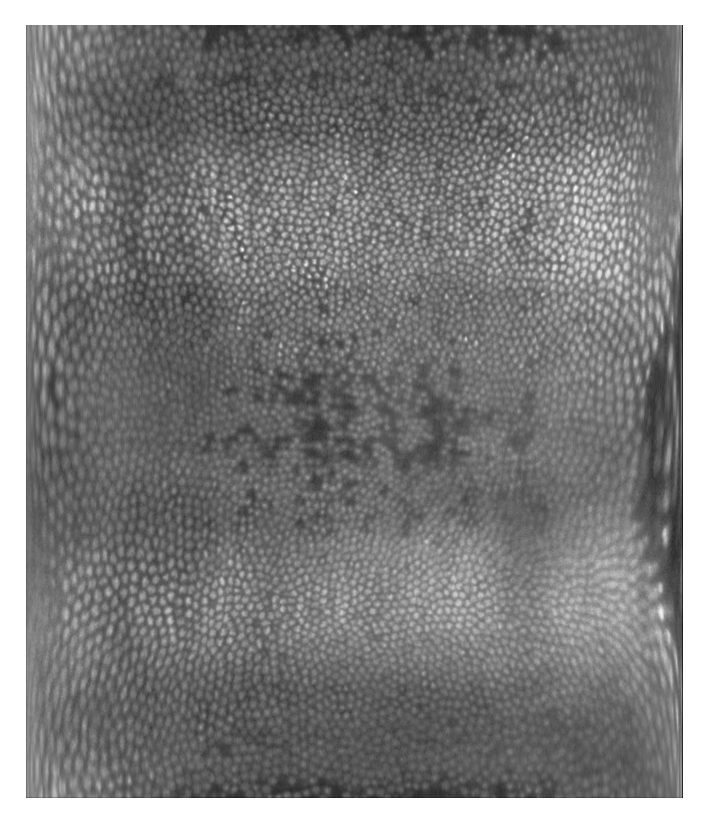

In [8]:
from skimage.io import imread
h = imread('/project/vitelli/jonathan/fruitfly/flydrive.synology.me/minimalData/Atlas_Data/WT/histone-RFP/20140912174700/MAX_Cyl1_2_000000_c1_rot_scaled_view1.tif')
print(h.shape)
fig, ax = plt.subplots(1, dpi=256, figsize=(4,4))
ax.axis('off')
r = plt.gcf().canvas.get_renderer()
im = ax.imshow(h[tt], cmap='Greys_r', extent=[0,696,0,820])
im = im.make_image(r)[0]
print(im.shape)
#im[:, im.shape[0]] = 0
from PIL import Image
img = Image.fromarray(im).convert('L')
img = img.resize([1024, 1024])
img.save('histones.png')

# Runt

(118, 2050, 1738)
(218, 335, 4)


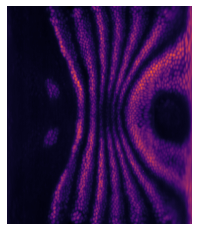

In [19]:
from skimage.io import imread
h = imread('/project/vitelli/jonathan/fruitfly/flydrive.synology.me/minimalData/Atlas_Data/WT/Runt/202001141730/MAX_Cyl1_2_000000_c1_rot_scaled_view1.tif')
print(h.shape)
fig, ax = plt.subplots(1)
ax.axis('off')
tt = 30
r = plt.gcf().canvas.get_renderer()
im = ax.imshow(h[tt], cmap='inferno', extent=[0,696,0,820])
im = im.make_image(r)[0]
print(im.shape)
#im[:, im.shape[0]] = 0
from PIL import Image
img = Image.fromarray(im).convert('RGB')
img = img.resize([1024, 1024])
img.save('runt_color.png')